<h1>CycleGAN Network Demonstration</h1>

CycleGAN is an unpaired image-to-image translation network using cycle-consistent generative adversarial networks.<br>
<center>
    <img src="demonstration_resources/cyclegan_blogs.jpg" style="width:50%;height:50%;"></img>
</center>
<br>
Because the network can perform unpaired transforms, it is simple to run multiple experiments simply by retraining the network using a new data set.<br><br>


<h2>Download additional models?</h2>
CycleGAN produces large network components. Each generator model file is 30MB and because the file size limit imposed on this submission is 100MB, only two model files for experiments were included in this repository. If you want more trained models, set DOWNLOAD_MODELS to 1 and all of the models will download from a different repository to a local directory and then delete after this notebook completes, otherwise only two experiments will be live demonstrations and the others will display previously generated images.

In [34]:
DOWNLOAD_MODELS = 0

<a id='contents'></a>
<h2>Contents</h2>
<a href='#ukiyoe'><h3>ukiyoe2photo</h3></a>
> Training the network using the data set ukiyoe2photo produces the transform from Ukiyo-e style paintings to photos and its inverse transform, photos to Ukiyo-e style paintings.

<a href='#man_woman'><h3>manwoman</h3></a>
> Training the network using the data set manwoman produces the transform from images of men to images of women and its inverse transform.

<a href='#bagpack'><h3>handbag_backpack</h3></a>
> Training the network using the data set handB_backP produces the transform from backpack images to handbag images and its inverse transform, handbag images to backpack images.

<a href='#monet'><h3>monet2photo</h3></a>
> Training the network using the data set monet2photo produces the transform from Monet's paintings to photos and its inverse transform, photos to Monet-styled paintings.

<a href='#vangogh'><h3>vangogh2photo</h3></a>
> Training the network using the data set vangogh2photo produces the transform from Van Gogh's paintings to photos and its inverse transform, photos to Van Gogh-styled paintings.

<a href='#iphone'><h3>iphone2dslr_flower</h3></a>
> Training the network using the data set iphone2dslr_flower produces a transform from normal photos to photos with shallow depth of field and its inverse transform.

<a href='#lossfunc'><h3>Examination of Loss Function Components</h3></a>
> This experiment examines the effect of each component of the loss function on the resulting image.

<h2> Test Environment Setup </h2>

In [35]:
from __future__ import print_function
import os.path
from torchvision import transforms
from Dataset import ImageSet
import torch
from torch.utils.data import DataLoader
import ModelTestFuncs as MTF
import matplotlib.pyplot as plt
import numpy as np
import imageio
from torch.autograd import Variable
from torchvision import utils as tv
import os
reload(MTF)

imageScale = 0.25;
images = ImageSet();
path = './img/test_images/'
test_transforms = [transforms.ToTensor(),
                transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))];
images.loadImageSet(path, test_transforms, "test", imageScale);
imgLoader = DataLoader(images, 1, shuffle=False);
imgs = [];
for i in range(1,7):
    imgs.append(imageio.imread("./img/test_images/IMG_"+str(i)+".JPG"));

Finished loading images


In [36]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

<a id='ukiyoe'></a>
<h2>ukiyoe2photo</h2>
<a href='#contents'><p>Back to contents</p></a>

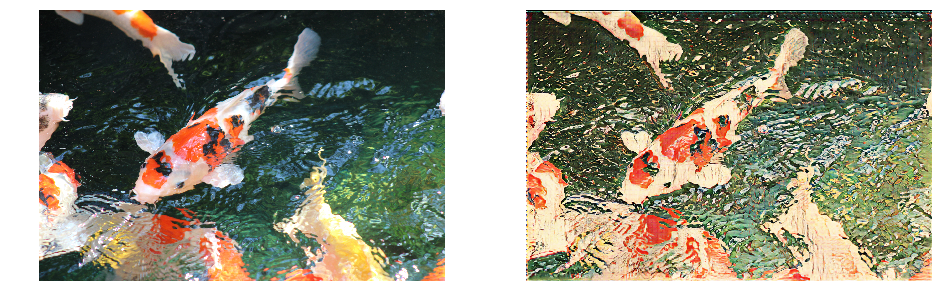

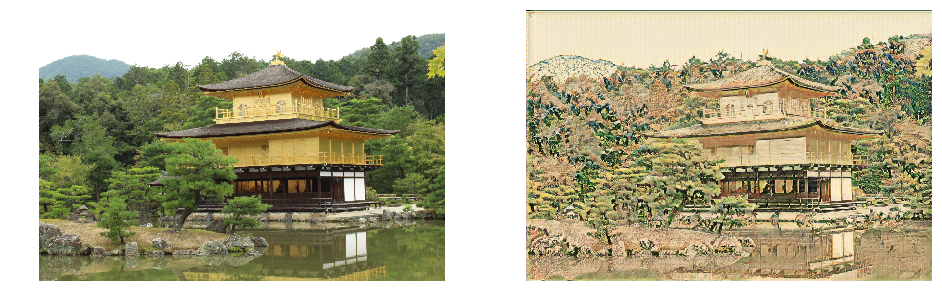

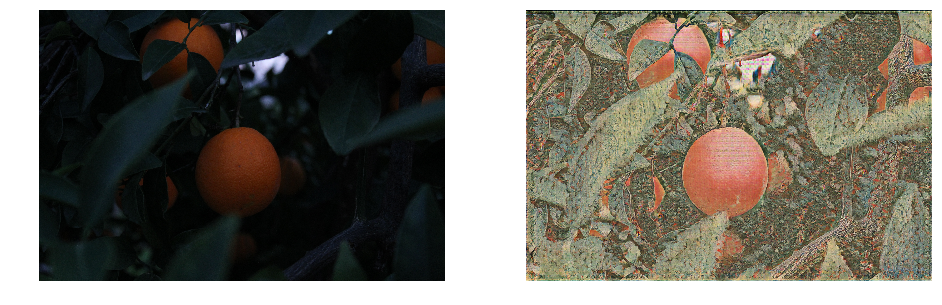

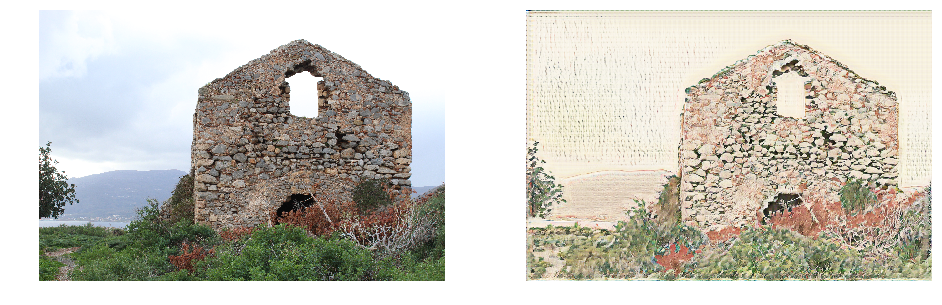

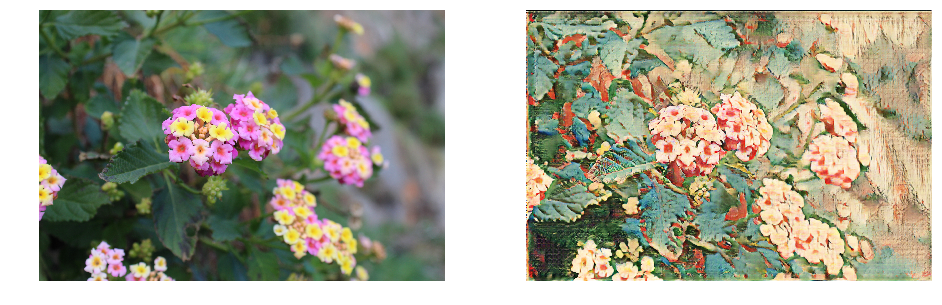

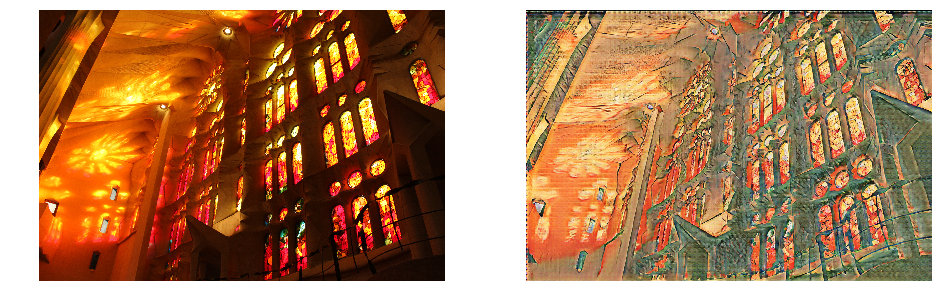

In [37]:
model = 'ukiyoe2photo';
modelfile = torch.load("./model/"+model+"/F.data");
F = MTF.prepModel(modelfile);

for i, img in enumerate(imgLoader):
    imgsize = img['img'].size();
    img_gpu = torch.cuda.FloatTensor(1,3,imgsize[2],imgsize[3]);
    img_var = Variable(img_gpu.copy_(img['img']));
    result = 0.5*(F(img_var).data+1.0);
    result = result.cpu().numpy().squeeze().transpose(1,2,0);
    plt.figure(figsize = (16,12))
    plt.subplot(1,2,1);
    plt.imshow(imgs[i])
    plt.axis('off');
    plt.subplot(1,2,2);
    plt.imshow(result)
    plt.axis('off');
plt.show();

del img_gpu
del F

<a id='bagpack'></a>
<h2>handbag_backpack</h2>
<a href='#contents'><p>Back to contents</p></a>

Finished loading images


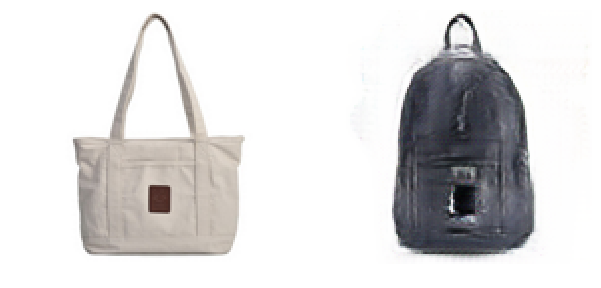

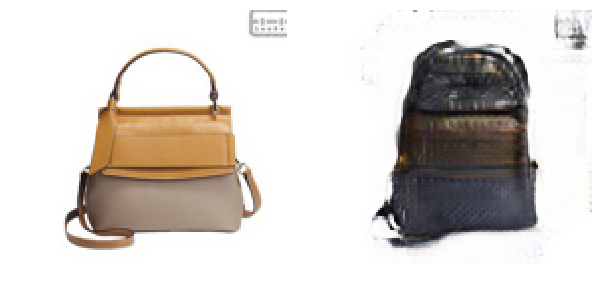

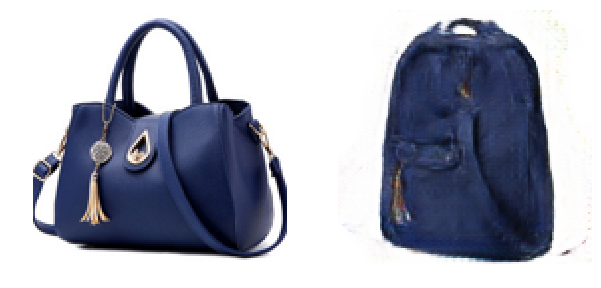

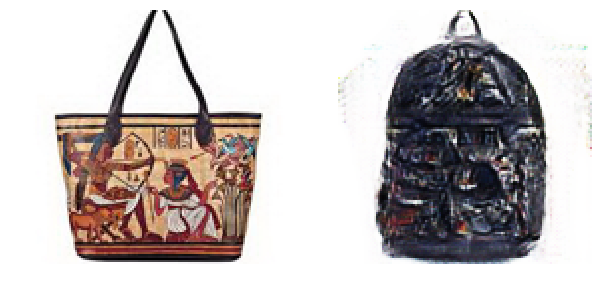

Finished loading images


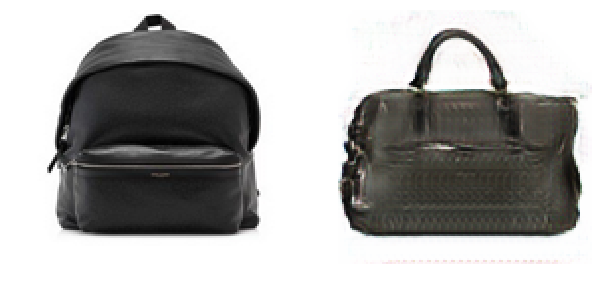

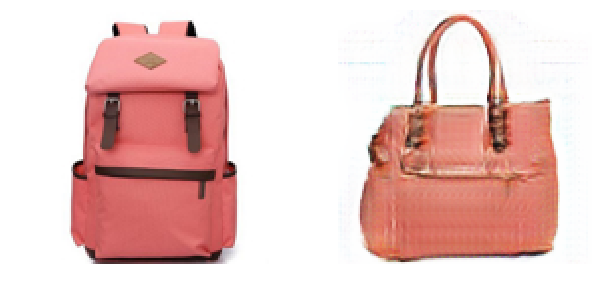

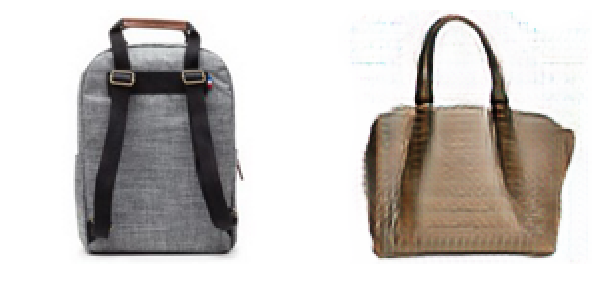

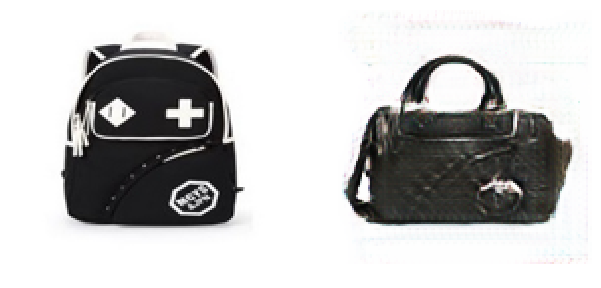

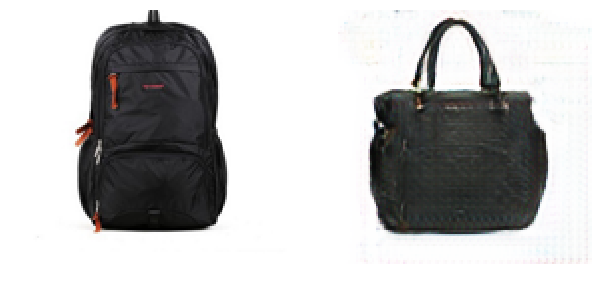

In [38]:
from PIL import Image
imageScale = 1;
im_size = 128
images = ImageSet();
path = './img/test_images_bag/handbag/'
test_transforms = [transforms.Resize(int(im_size*1.12), Image.BICUBIC),
                  transforms.CenterCrop(im_size),
                  transforms.ToTensor(),
                  transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))];
images.loadImageSet(path, test_transforms, "test", imageScale);
imgLoader = DataLoader(images, 1, shuffle=False);
   
model = 'handB_backP';
modelfile = torch.load("./model/"+model+"/G.data");
F = MTF.prepModel(modelfile);

for i, img in enumerate(imgLoader):
    imgsize = img['img'].size();
    img_gpu = torch.cuda.FloatTensor(1,3,imgsize[2],imgsize[3]);
    img_var = Variable(img_gpu.copy_(img['img']));
    result = 0.5*(F(img_var).data+1.0);
    result = result.cpu().numpy().squeeze().transpose(1,2,0);
    plt.figure(figsize = (10,6))
    plt.subplot(1,2,1);
    plt.imshow((0.5*(img['img'].numpy()+1)).squeeze().transpose(1,2,0))
    plt.axis('off');
    plt.subplot(1,2,2);
    plt.imshow(result)
    plt.axis('off');
plt.show();

imageScale = 1;
images = ImageSet();
path = './img/test_images_bag/backpack/'
test_transforms = [transforms.Resize(int(im_size*1.12), Image.BICUBIC),
                  transforms.CenterCrop(im_size),
                  transforms.ToTensor(),
                  transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))];
images.loadImageSet(path, test_transforms, "test", imageScale);
imgLoader = DataLoader(images, 1, shuffle=False);


modelfile = torch.load("./model/"+model+"/F.data");
F = MTF.prepModel(modelfile);

for i, img in enumerate(imgLoader):
    imgsize = img['img'].size();
    img_gpu = torch.cuda.FloatTensor(1,3,imgsize[2],imgsize[3]);
    img_var = Variable(img_gpu.copy_(img['img']));
    result = 0.5*(F(img_var).data+1.0);
    result = result.cpu().numpy().squeeze().transpose(1,2,0);
    plt.figure(figsize = (10,6))
    plt.subplot(1,2,1);
    plt.imshow((0.5*(img['img'].numpy()+1)).squeeze().transpose(1,2,0))
    plt.axis('off');
    plt.subplot(1,2,2);
    plt.imshow(result)
    plt.axis('off');
plt.show();

del img_gpu
del F

<a id='man_woman'></a>
<h2>manwoman</h2>
<a href='#contents'><p>Back to contents</p></a>

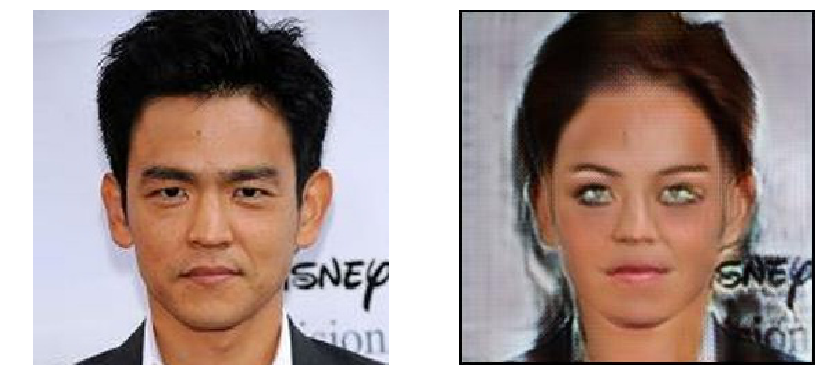

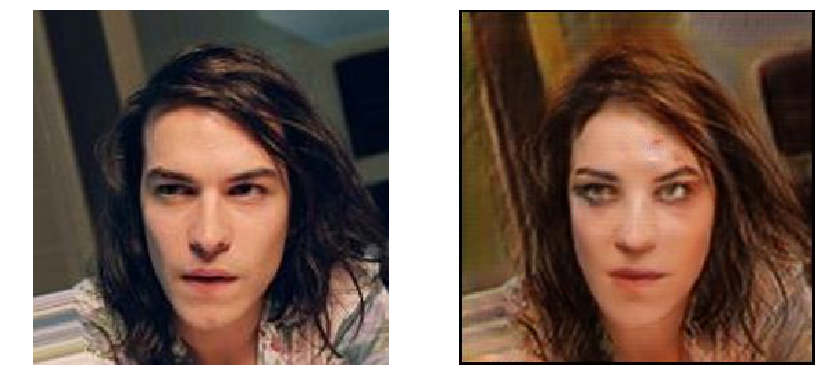

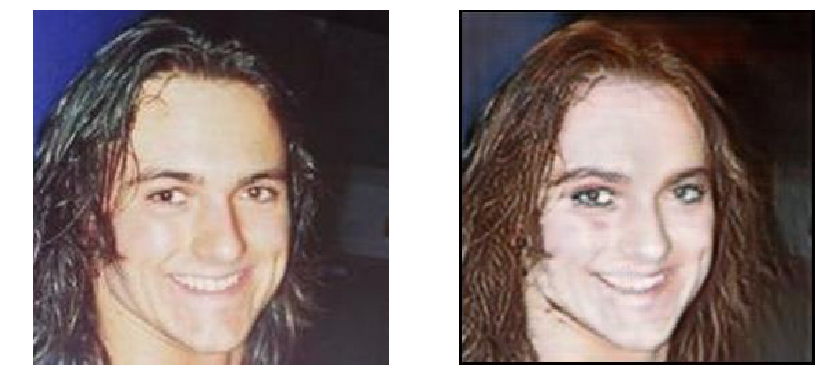

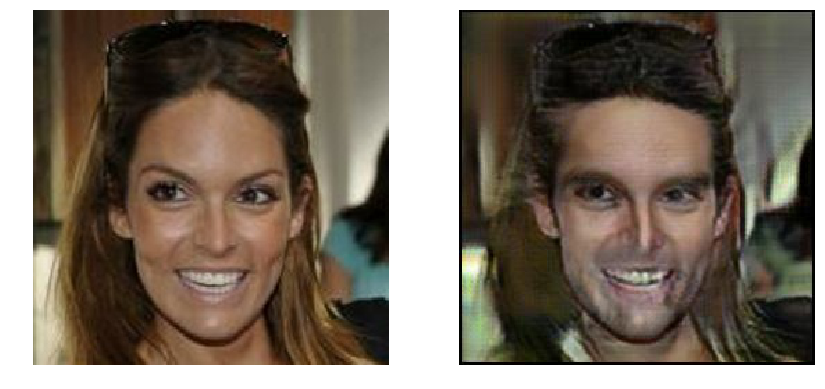

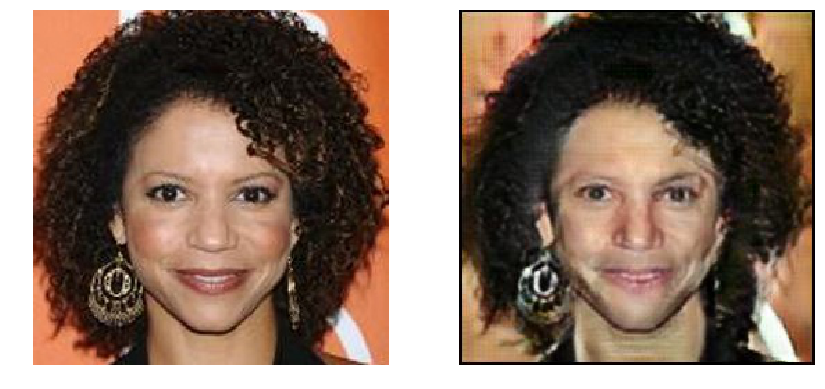

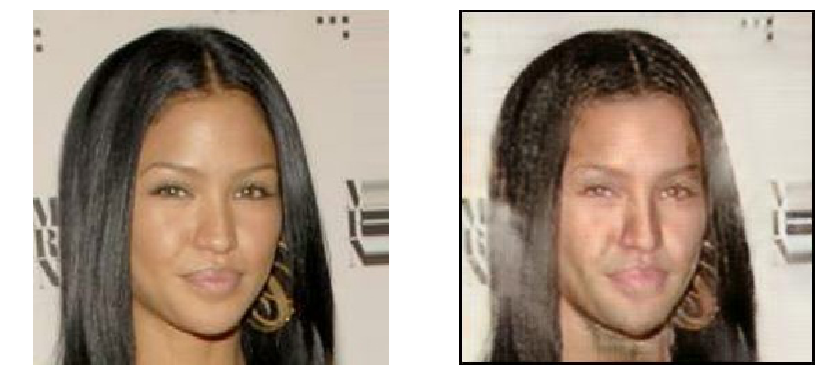

In [39]:
if (DOWNLOAD_MODELS):
    imageScale = 1;
    images = ImageSet();
    path = './img/test_images_face/men/'
    test_transforms = [transforms.ToTensor(),
                    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))];
    images.loadImageSet(path, test_transforms, "test", imageScale);
    imgLoader = DataLoader(images, 1, shuffle=False);

    model = 'manwoman';
    modelfile = torch.load("./model/"+model+"/G.data");
    F = MTF.prepModel(modelfile);

    for i, img in enumerate(imgLoader):
        imgsize = img['img'].size();
        img_gpu = torch.cuda.FloatTensor(1,3,imgsize[2],imgsize[3]);
        img_var = Variable(img_gpu.copy_(img['img']));
        result = 0.5*(F(img_var).data+1.0);
        result = result.cpu().numpy().squeeze().transpose(1,2,0);
        plt.figure(figsize = (14,10))
        plt.subplot(1,2,1);
        plt.imshow((0.5*(img['img'].numpy()+1)).squeeze().transpose(1,2,0))
        plt.axis('off');
        plt.subplot(1,2,2);
        plt.imshow(result)
        plt.axis('off');
    plt.show();

    imageScale = 1;
    images = ImageSet();
    path = './img/test_images_face/women/'
    test_transforms = [transforms.ToTensor(),
                    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))];
    images.loadImageSet(path, test_transforms, "test", imageScale);
    imgLoader = DataLoader(images, 1, shuffle=False);


    modelfile = torch.load("./model/"+model+"/F.data");
    F = MTF.prepModel(modelfile);

    for i, img in enumerate(imgLoader):
        imgsize = img['img'].size();
        img_gpu = torch.cuda.FloatTensor(1,3,imgsize[2],imgsize[3]);
        img_var = Variable(img_gpu.copy_(img['img']));
        result = 0.5*(F(img_var).data+1.0);
        result = result.cpu().numpy().squeeze().transpose(1,2,0);
        plt.figure(figsize = (14,10))
        plt.subplot(1,2,1);
        plt.imshow((0.5*(img['img'].numpy()+1)).squeeze().transpose(1,2,0))
        plt.axis('off');
        plt.subplot(1,2,2);
        plt.imshow(result)
        plt.axis('off');
    plt.show();

    del img_gpu
    del F
else:
    for i in range(1,4):
        plt.figure(figsize = (14,10))
        plt.subplot(1,2,1);
        imgi = imageio.imread("./img/test_images_face/men/face_"+str(i)+".jpg");
        plt.imshow(imgi)
        plt.axis('off');
        plt.subplot(1,2,2);
        imgo = imageio.imread("./outputs/manwoman/men/out_face_"+str(i)+".jpg");
        plt.imshow(imgo)
        plt.axis('off');
    for i in range(1,4):
        plt.figure(figsize = (14,10))
        plt.subplot(1,2,1);
        imgi = imageio.imread("./img/test_images_face/women/face_"+str(i)+".jpg");
        plt.imshow(imgi)
        plt.axis('off');
        plt.subplot(1,2,2);
        imgo = imageio.imread("./outputs/manwoman/women/out_face_"+str(i)+".jpg");
        plt.imshow(imgo)
        plt.axis('off');
        

In [40]:
imageScale = 0.25;
images = ImageSet();
path = './img/test_images/'
test_transforms = [transforms.ToTensor(),
                transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))];
images.loadImageSet(path, test_transforms, "test", imageScale);
imgLoader = DataLoader(images, 1, shuffle=False);
imgs = [];
for i in range(1,7):
    imgs.append(imageio.imread("./img/test_images/IMG_"+str(i)+".JPG"));

Finished loading images


<a id='monet'></a>
<h2>monet2photo</h2>
<a href='#contents'><p>Back to contents</p></a>

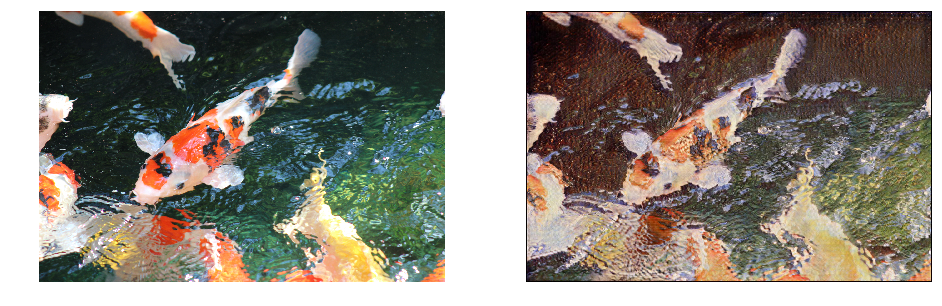

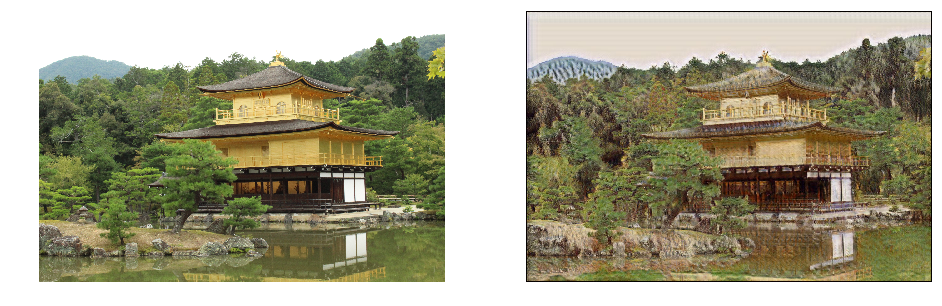

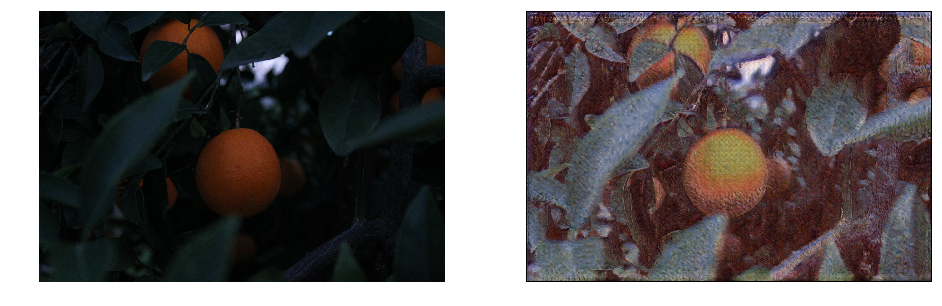

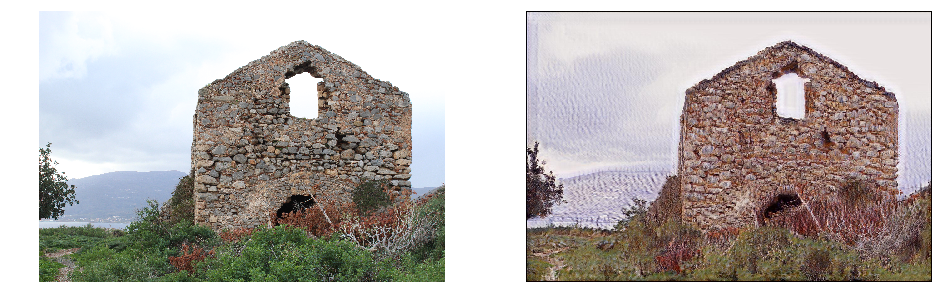

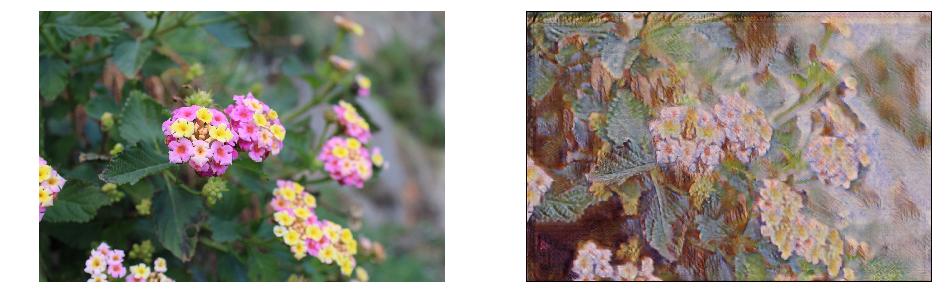

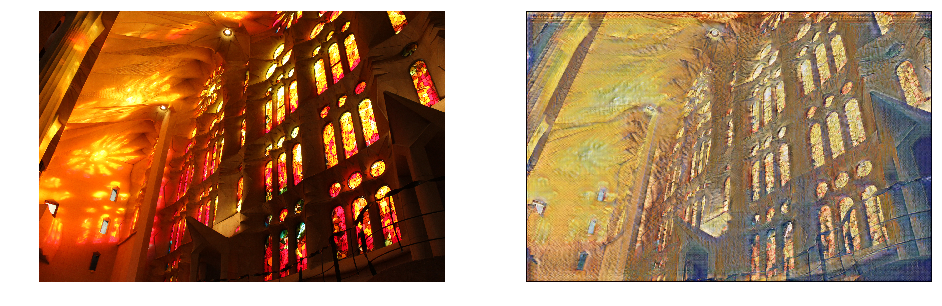

In [41]:
model = 'monet2photo'
if (DOWNLOAD_MODELS):
    direct = "F";
    MTF.downloadModel(model, direct);
    modelfile = torch.load("./modelDL/"+model+"/" + direct + ".data");
    F = MTF.prepModel(modelfile);
    for i, img in enumerate(imgLoader):
        imgsize = img['img'].size();
        img_gpu = torch.cuda.FloatTensor(1,3,imgsize[2],imgsize[3]);
        img_var = Variable(img_gpu.copy_(img['img']));
        result = 0.5*(F(img_var).data+1.0);
        result = result.cpu().numpy().squeeze().transpose(1,2,0);
        plt.figure(figsize = (16,12))
        plt.subplot(1,2,1);
        plt.imshow(imgs[i])
        plt.axis('off');
        plt.subplot(1,2,2);
        plt.imshow(result)
        plt.axis('off');
    plt.show();

    del img_gpu
    del F
    os.remove("./modelDL/"+model+"/" + direct + ".data");
else:
    for i in range(1,7):
        plt.figure(figsize = (16,12))
        plt.subplot(1,2,1);
        plt.imshow(imgs[i-1])
        plt.axis('off');
        plt.subplot(1,2,2);
        imgo = imageio.imread("./outputs/"+model+"/test_images/out_IMG_"+str(i)+".JPG");
        plt.imshow(imgo)
        plt.axis('off');
    plt.show();

<a id='vangogh'></a>
<h2>vangogh2photo</h2>
<a href='#contents'><p>Back to contents</p></a>

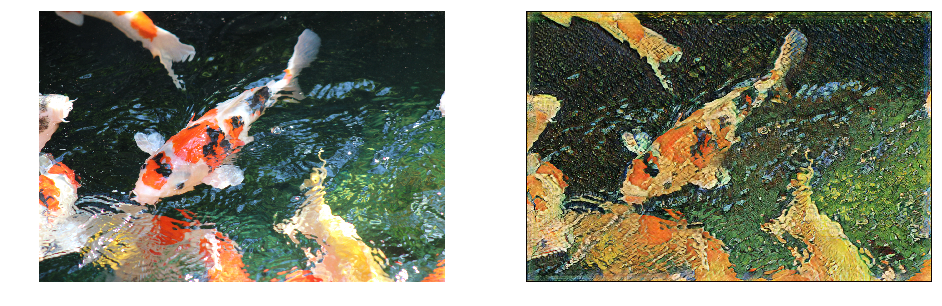

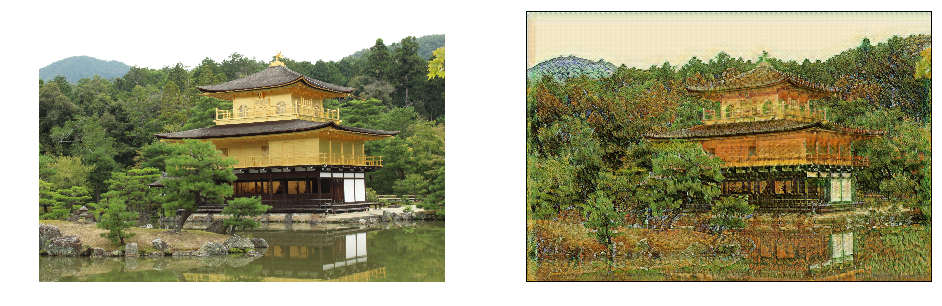

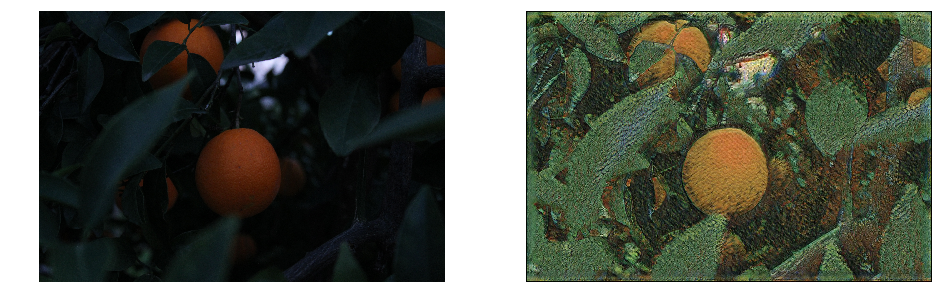

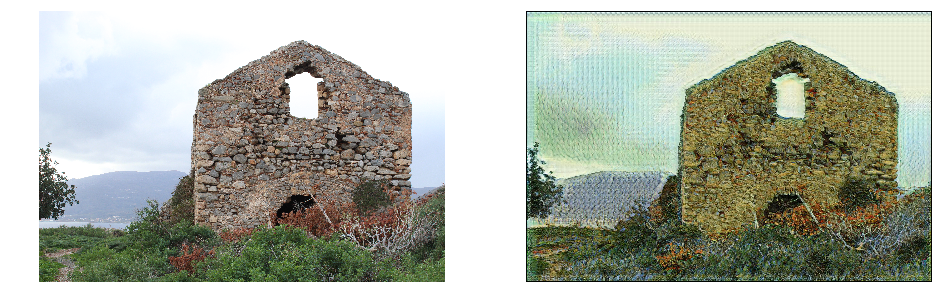

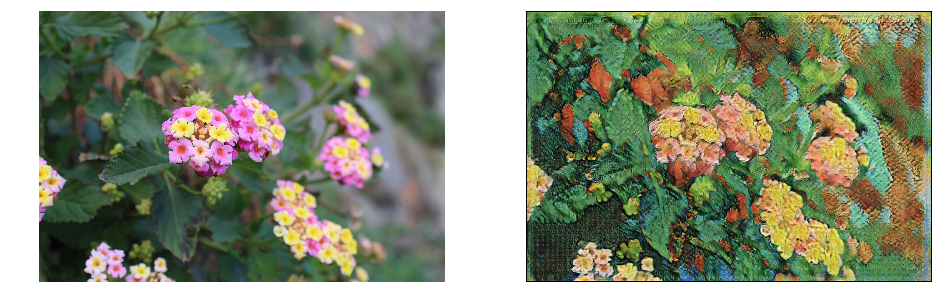

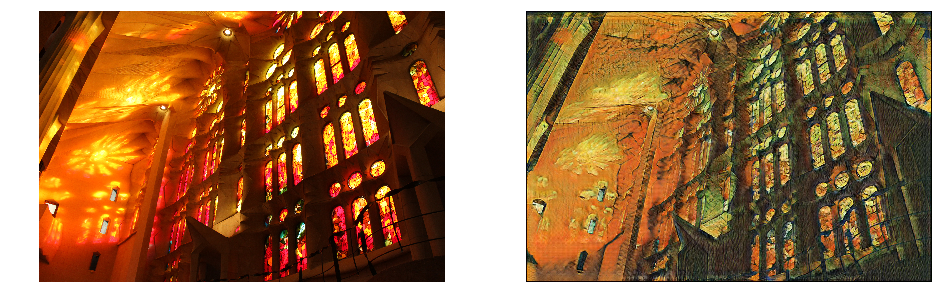

In [42]:
model = 'vangogh2photo'
if (DOWNLOAD_MODELS):
    direct = "F";
    MTF.downloadModel(model, direct);
    modelfile = torch.load("./modelDL/"+model+"/" + direct + ".data");
    F = MTF.prepModel(modelfile);
    for i, img in enumerate(imgLoader):
        imgsize = img['img'].size();
        img_gpu = torch.cuda.FloatTensor(1,3,imgsize[2],imgsize[3]);
        img_var = Variable(img_gpu.copy_(img['img']));
        result = 0.5*(F(img_var).data+1.0);
        result = result.cpu().numpy().squeeze().transpose(1,2,0);
        plt.figure(figsize = (16,12))
        plt.subplot(1,2,1);
        plt.imshow(imgs[i])
        plt.axis('off');
        plt.subplot(1,2,2);
        plt.imshow(result)
        plt.axis('off');
    plt.show();

    del img_gpu
    del F
    os.remove("./modelDL/"+model+"/" + direct + ".data");
else:
    for i in range(1,7):
        plt.figure(figsize = (16,12))
        plt.subplot(1,2,1);
        plt.imshow(imgs[i-1])
        plt.axis('off');
        plt.subplot(1,2,2);
        imgo = imageio.imread("./outputs/"+model+"/test_images/out_IMG_"+str(i)+".JPG");
        plt.imshow(imgo)
        plt.axis('off');
    plt.show();

<a id='iphone'></a>
<h2>iphone2dslr_photo</h2>
<a href='#contents'><p>Back to contents</p></a>

Finished loading images


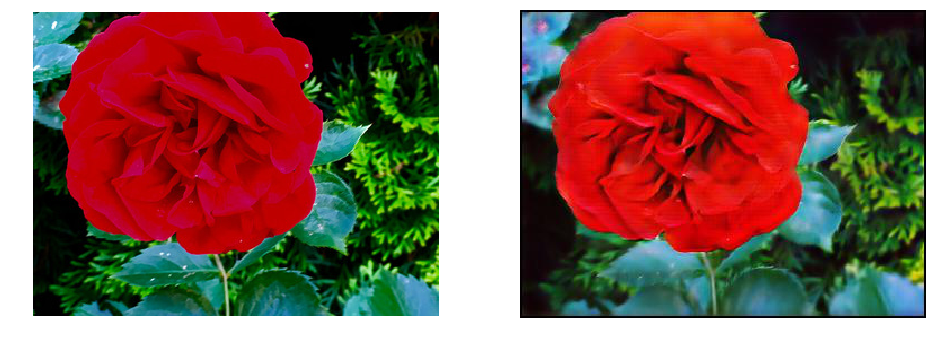

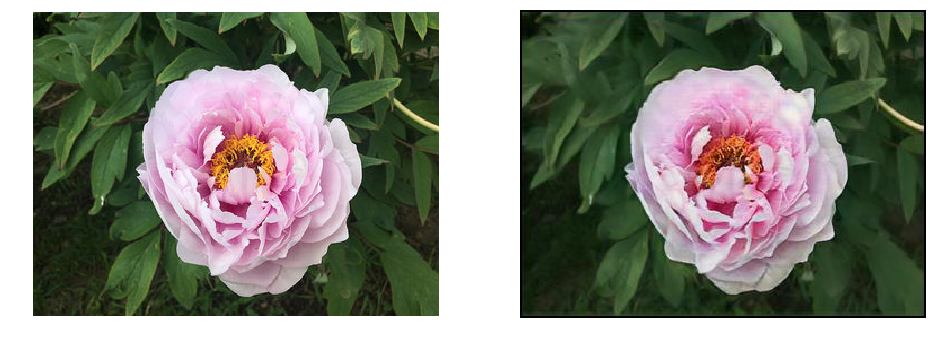

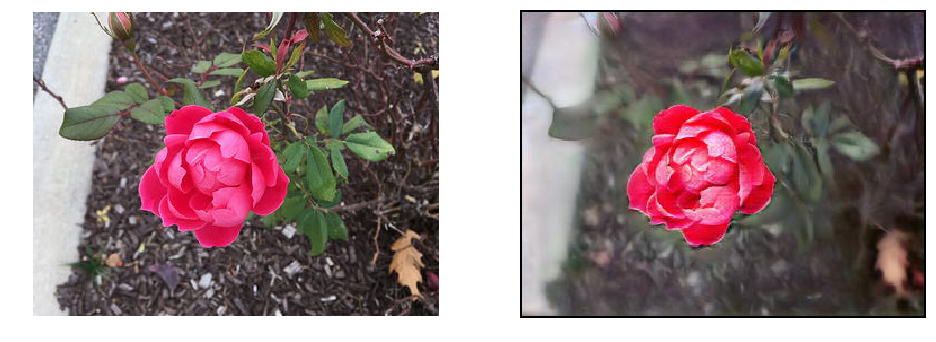

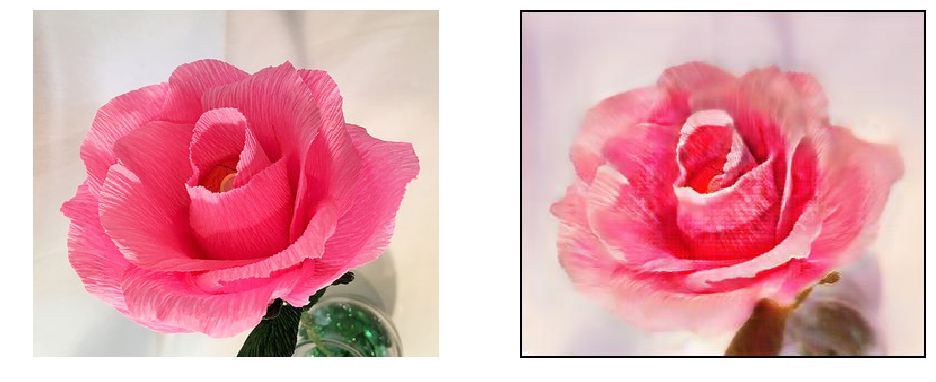

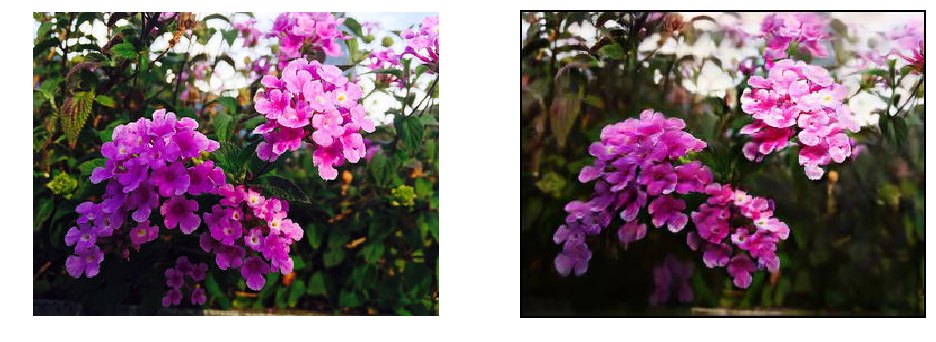

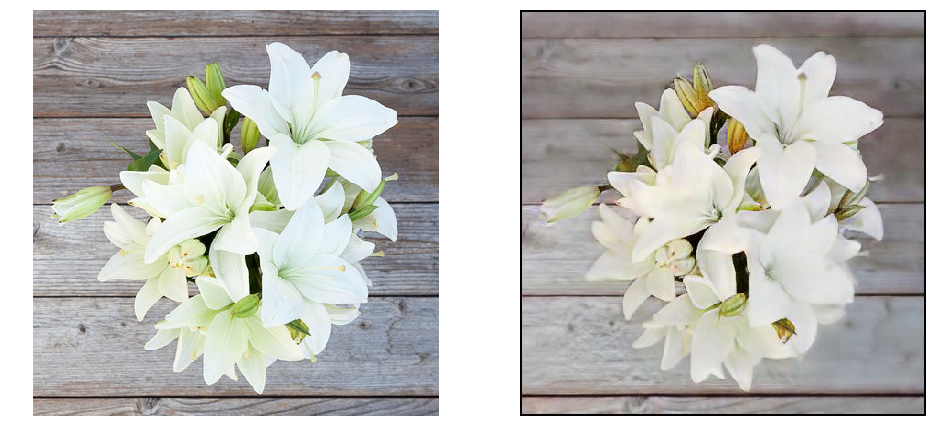

In [43]:
imageScale = 1;
images = ImageSet();
path = './img/test_flowers/'
test_transforms = [transforms.ToTensor(),
                transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))];
images.loadImageSet(path, test_transforms, "test", imageScale);
imgLoader = DataLoader(images, 1, shuffle=False);
model = 'iphone2dslr_flower'
if (DOWNLOAD_MODELS):
    direct = "G";
    MTF.downloadModel(model, direct);
    modelfile = torch.load("./modelDL/"+model+"/" + direct + ".data");
    F = MTF.prepModel(modelfile);
    for i, img in enumerate(imgLoader):
        imgsize = img['img'].size();
        img_gpu = torch.cuda.FloatTensor(1,3,imgsize[2],imgsize[3]);
        img_var = Variable(img_gpu.copy_(img['img']));
        result = 0.5*(F(img_var).data+1.0);
        result = result.cpu().numpy().squeeze().transpose(1,2,0);
        plt.figure(figsize = (16,12))
        plt.subplot(1,2,1);
        plt.imshow((0.5*(img['img'].numpy()+1)).squeeze().transpose(1,2,0))
        plt.axis('off');
        plt.subplot(1,2,2);
        plt.imshow(result)
        plt.axis('off');
    plt.show();

    del img_gpu
    del F
    os.remove("./modelDL/"+model+"/" + direct + ".data");
else:
    for i in range(1,7):
        plt.figure(figsize = (16,12))
        plt.subplot(1,2,1);
        imgi = imageio.imread("./img/test_flowers/flower_"+str(i)+".jpg");
        plt.imshow(imgi)
        plt.axis('off');
        plt.subplot(1,2,2);
        imgo = imageio.imread("./outputs/test_flowers/out_flower_"+str(i)+".jpg");
        plt.imshow(imgo)
        plt.axis('off');
    plt.show();

<a id='lossfunc'></a>
<h2>Examination of Loss Function Components</h2>
<a href='#contents'><p>Back to contents</p></a>
<br>
This experiment examines the effect of the different components of the CycleGAN objective function:<br>
The CycleGAN objective function is:<br>
$L(G, F, D_x, D_y) = L_{GAN}(G, D_y, X, Y) + L_{GAN}(F, D_x, X, Y) + \lambda L_{Cyc}(G,F) + L_{Identity}(G,F)$

There are two GAN network losses, a cycle-consistency loss, and an identity loss.

<h3>Identity Loss</h3><br>
The identity loss $L_{Identity}(G,F) = E_{x\sim Pdata(x)}[\|F(x)-x\|_1] + E_{y\sim Pdata(y)}[\|G(y)-y\|_1]$ was introduced by Zhu et al. in their CycleGAN paper to preserve the color of the input image during a transformation. Without the identity loss, the generators can change the tint of the original image to match the target set, rather than matching the tint of the input image.

<h3> Cycle-Consistency Loss </h3>
The cycle-consistency loss is the main contribution of the CycleGAN paper. Other authors Gatsy et al. used convolutional neural networks to produce style-transfer results and others used GANs for image generation. CycleGAN's introduction of the cycle-consistency loss allowed image-to-image translation to produce more convincing images by requiring that the inverse transform also produced a convincing image.<br>
The equation for the cycle-consistency loss is $L_{Cyc}(G,F) = E_{x\sim Pdata(x)}[\|F(G(x)) − x\|_1]+E_{y∼Pdata(y)}[\|G(F(y)) − y\|_1]$.

<h3> ukiyoe2photo Loss Test </h3>
Identity loss and cycle-consistency loss were removed while using the ukiyoe2photo data set, producing the following results:

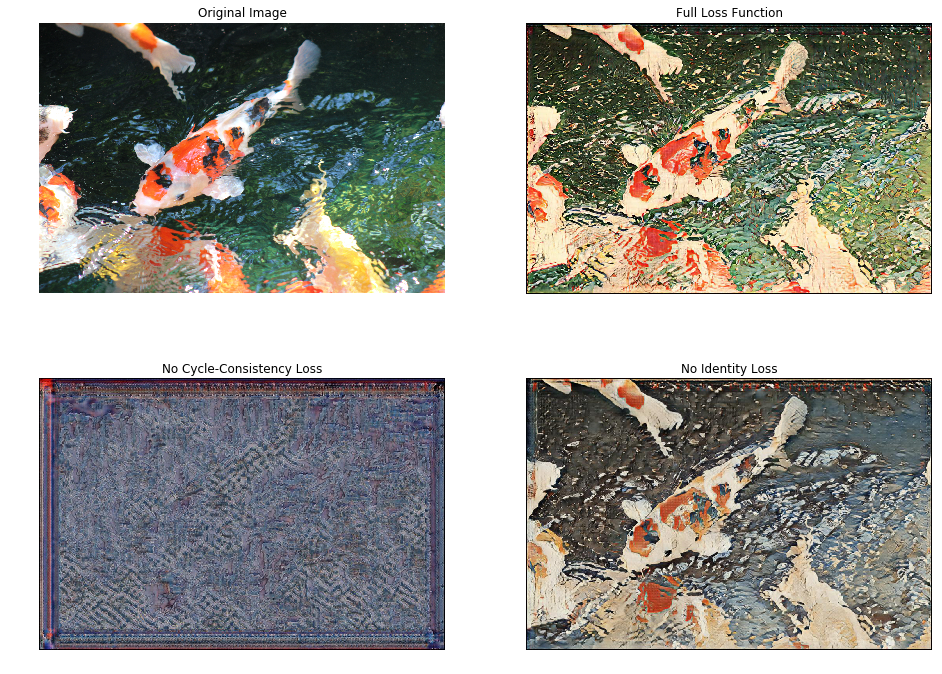

In [44]:
plt.figure(figsize = (16,12))
plt.subplot(2,2,1);
img0 = imageio.imread("./img/test_images/IMG_1.JPG");
plt.imshow(img0)
plt.axis('off');
plt.title("Original Image")

plt.subplot(2,2,2);
img1 = imageio.imread("./outputs/ukiyoe2photo/test_images/out_IMG_1.JPG");
plt.imshow(img1)
plt.axis('off');
plt.title("Full Loss Function")

plt.subplot(2,2,3);
img2 = imageio.imread("./outputs/test_loss/out_IMG_1_gan.JPG");
plt.imshow(img2)
plt.axis('off');
plt.title("No Cycle-Consistency Loss")

plt.subplot(2,2,4);
img3 = imageio.imread("./outputs/test_loss/out_IMG_1_noident.JPG");
plt.imshow(img3)
plt.axis('off');
plt.title("No Identity Loss")
plt.show();